# VMD-TCN-LSTM-MHA Hyperparameter Optimization Analysis

## Table of Contents
* [Requirements](#requirements)
* [Data Setup](#data-setup)
* [Optimization Study Figures](#optimization-study-figures)
    * [Optimization History Plots](#optimization-history-plots)
    * [Intermediate Values Plots](#intermediate-values-plots)
    * [Parallel Coordinate Plots](#parallel-coordinate-plots)
    * [Parameter Importance Plots](#parameter-importance-plots)

----

## Requirements

In [1]:
from joblib import load

import plotly.io as pio

from optuna import visualization as ov

pio.renderers.default = 'vscode+svg'

----

## Data Setup

In [2]:
imf1_study = load('../results/hpo/imf1_tcn_lstm_mha_study.pkl')
imf2_study = load('../results/hpo/imf2_tcn_lstm_mha_study.pkl')
imf3_study = load('../results/hpo/imf3_tcn_lstm_mha_study.pkl')
imf4_study = load('../results/hpo/imf4_tcn_lstm_mha_study.pkl')
imf5_study = load('../results/hpo/imf5_tcn_lstm_mha_study.pkl')
resid_study = load('../results/hpo/resid_tcn_lstm_mha_study.pkl')

In [3]:
studies = [imf1_study, imf2_study, imf3_study, imf4_study, imf5_study, resid_study]
titles = [str(_).upper() for _ in range(1, 6)]+['Residual']
uncond_params = ['batch_size', 'lr_init', 'kernel_size', 'tcn_dropout', 'hidden_size0', 'hidden_size1', 'hidden_size2', 'lstm_dropout0', 'lstm_dropout1', 'mha_dropout', 'mha_heads']


----

## Optimization Study Figures

### Optimization History Plots

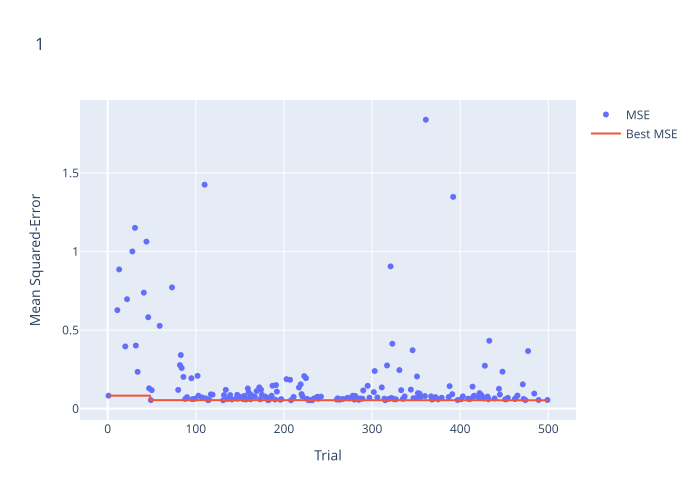

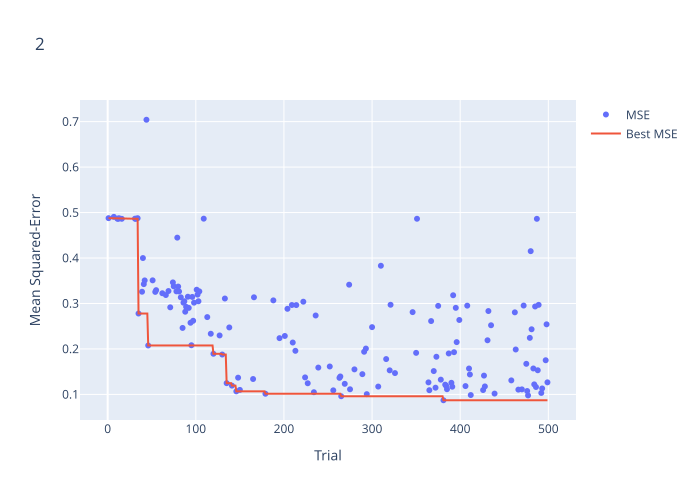

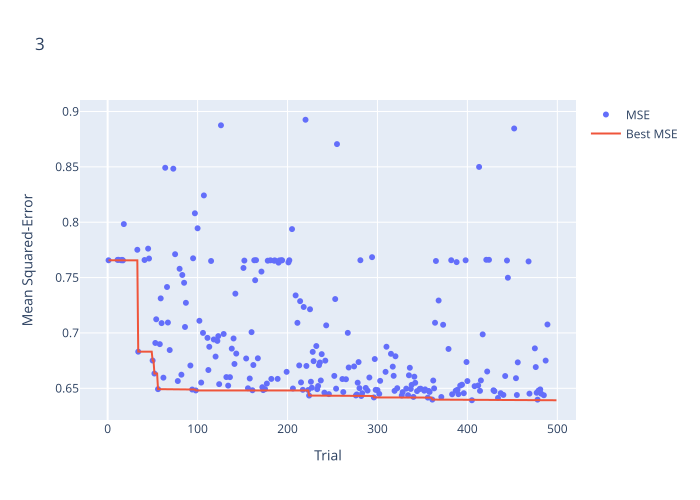

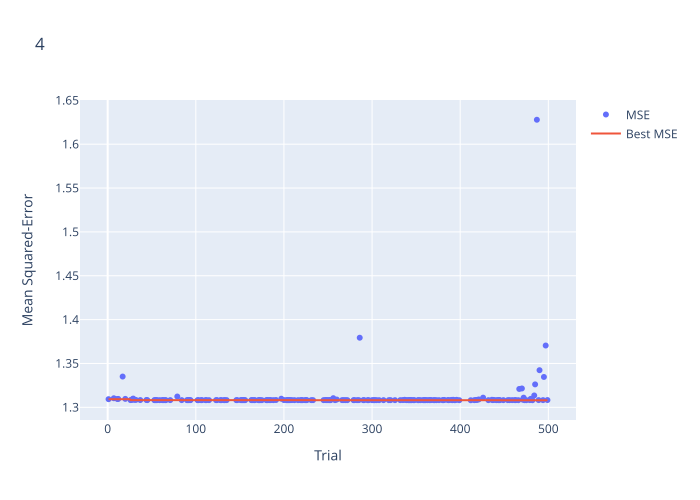

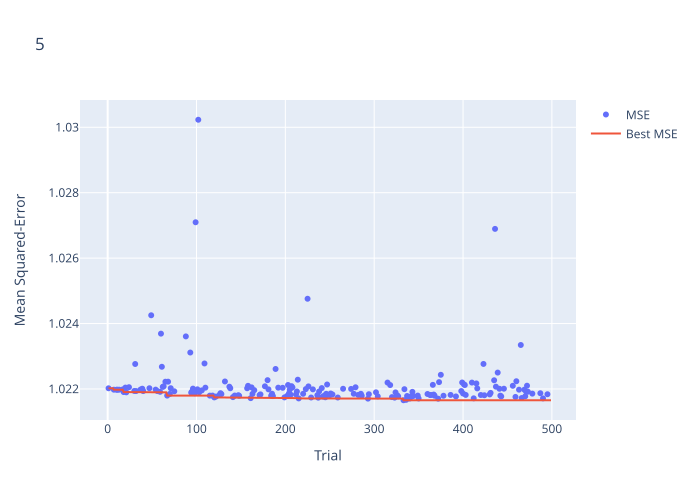

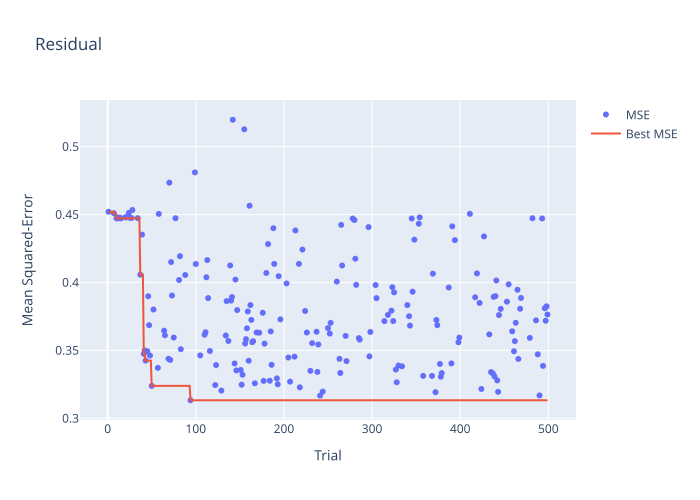

In [4]:
for study, title in zip(studies, titles):
    fig = ov.plot_optimization_history(study)
    fig.update_layout(title=title, yaxis_title='Mean Squared-Error')
    fig.data[0].name = 'MSE'
    fig.data[1].name = 'Best MSE'
    fig.show()

### Intermediate Values Plots

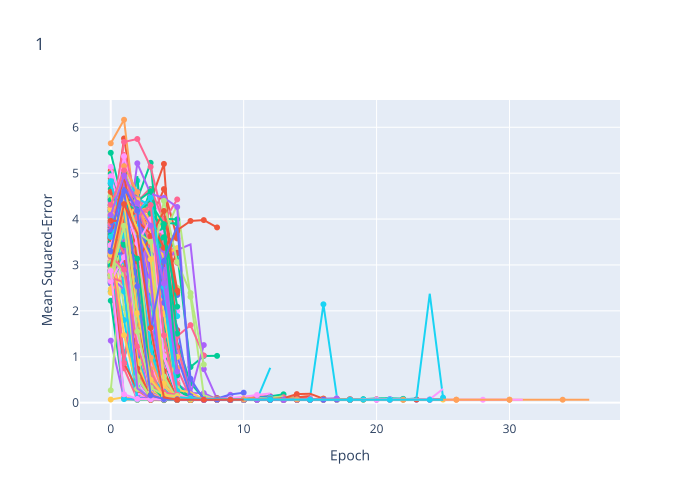

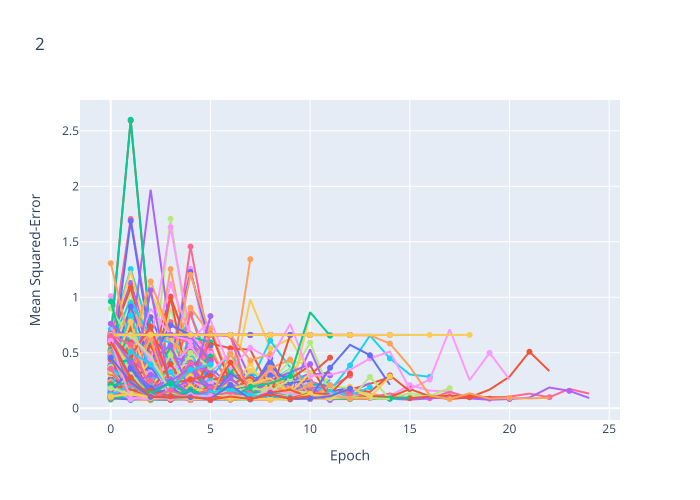

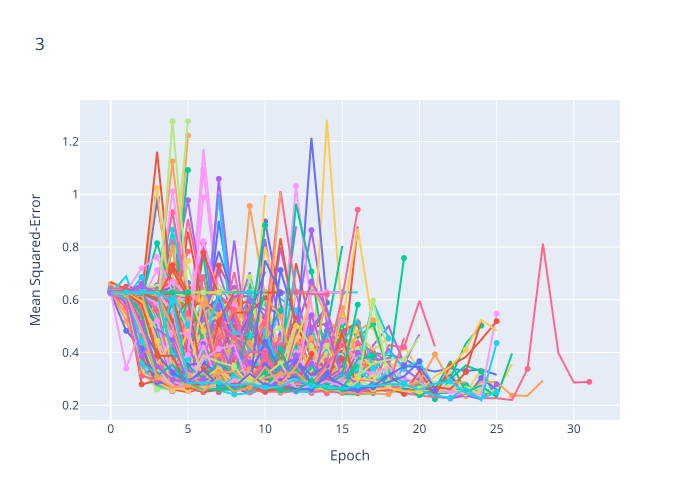

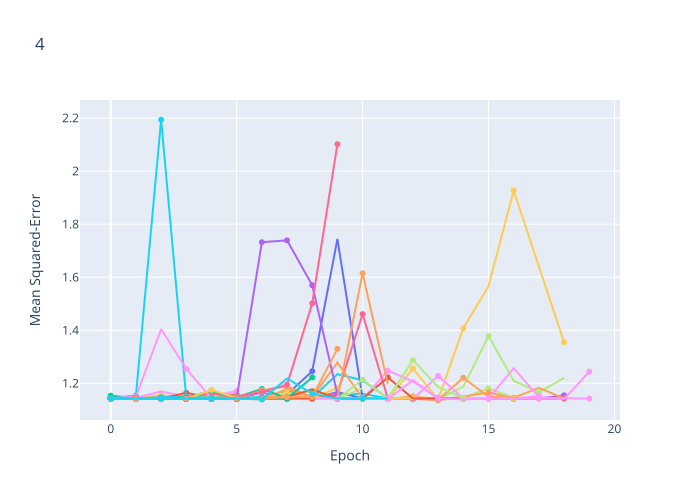

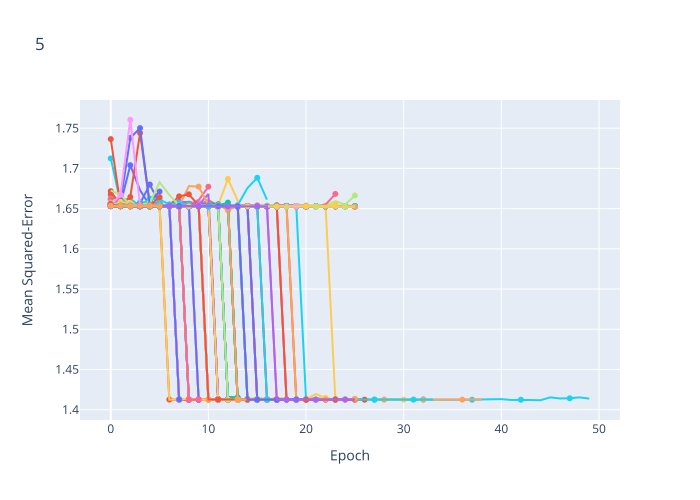

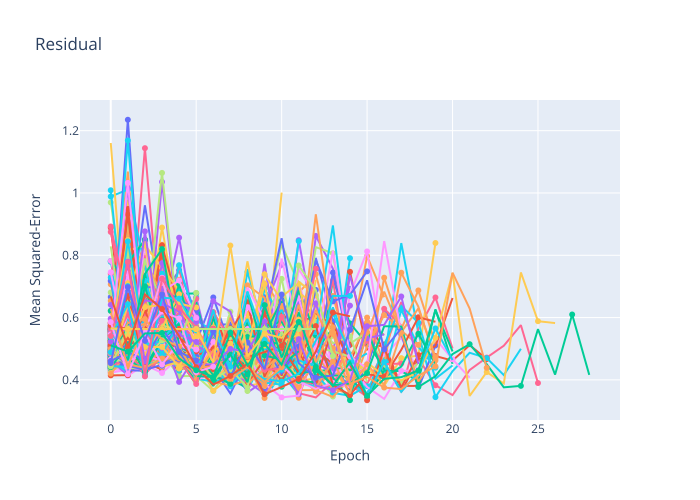

In [5]:
for study, title in zip(studies, titles):
    fig = ov.plot_intermediate_values(study)
    fig.update_layout(title=title, yaxis_title='Mean Squared-Error', xaxis_title='Epoch')
    fig.show()

### Parallel Coordinate Plots

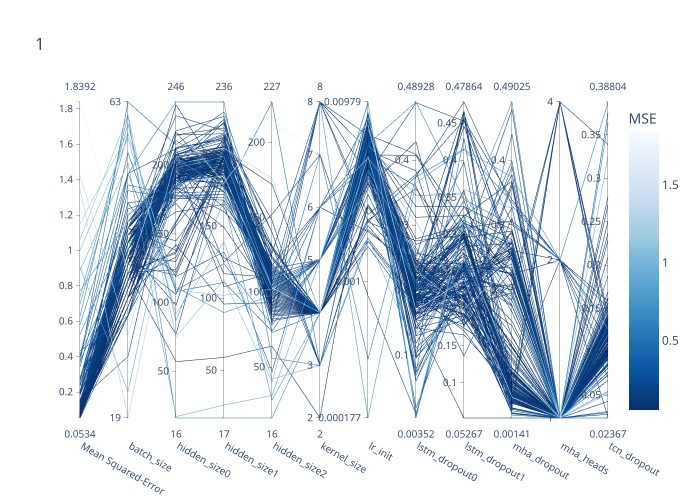

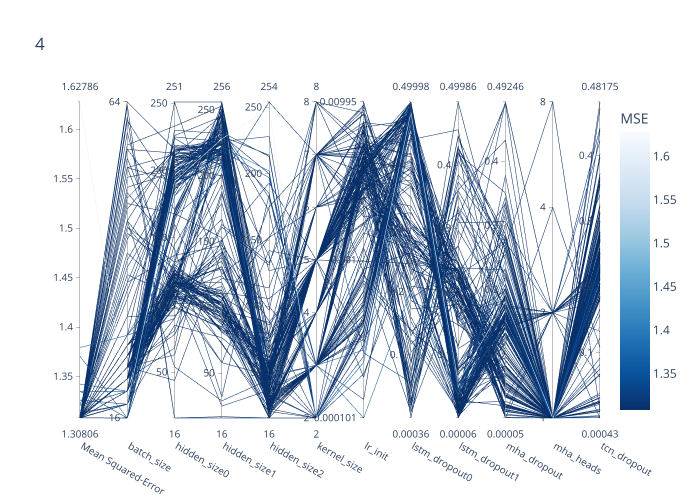

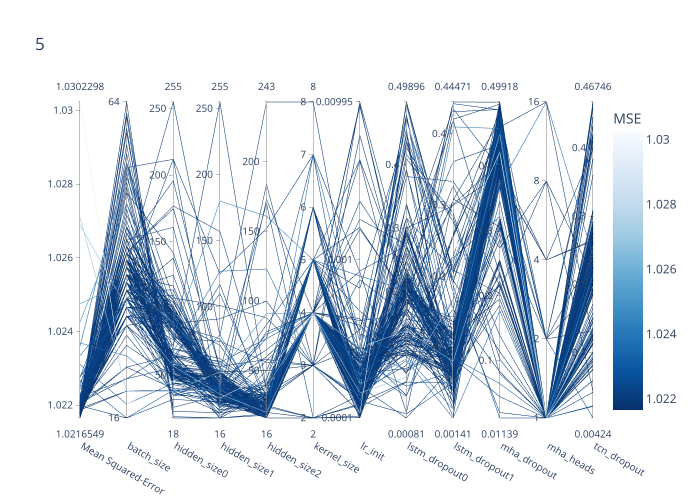

In [6]:
for study, title in zip(studies, titles):
    fig = ov.plot_parallel_coordinate(study, params=uncond_params)
    fig.update_layout(title=title)
    fig.data[0].dimensions[0].label = 'Mean Squared-Error'
    fig.data[0].line.colorbar.title = 'MSE'
    fig.show()

### Parameter Importance Plots

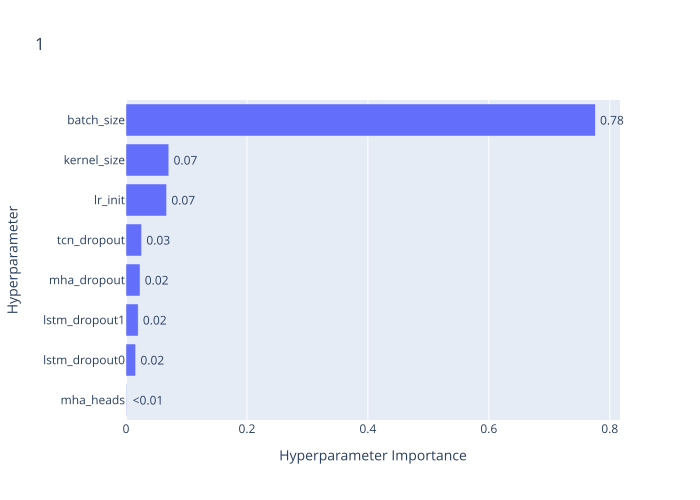

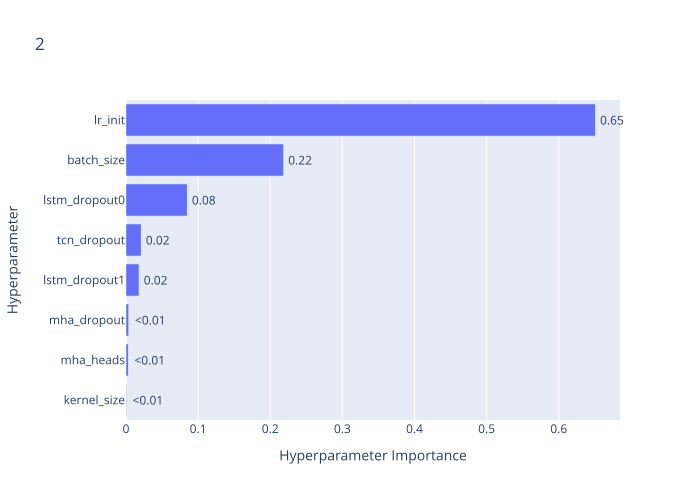

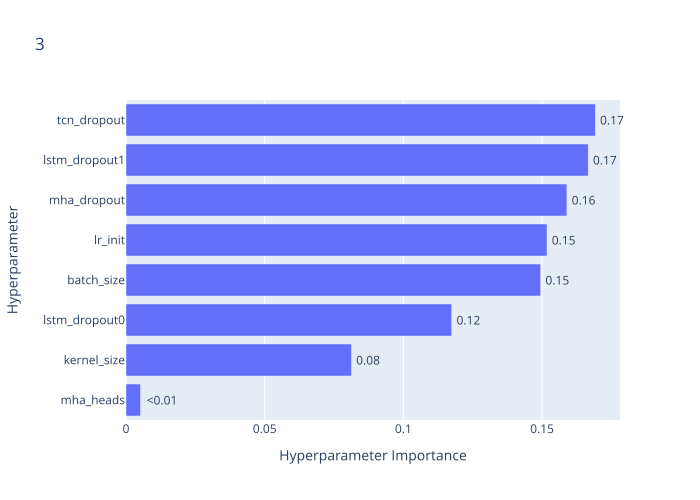

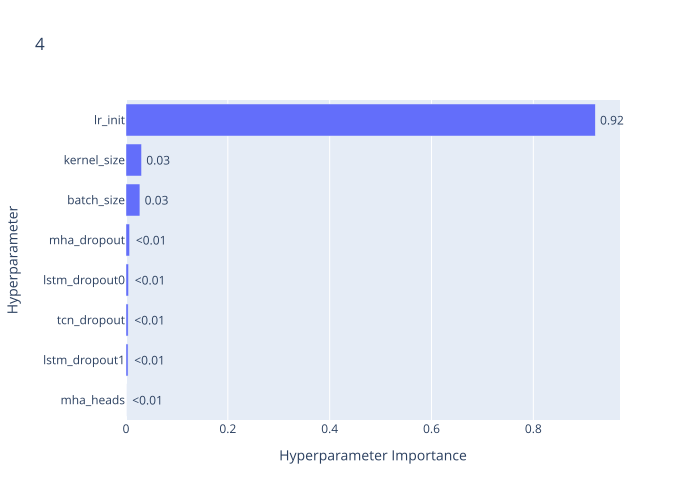

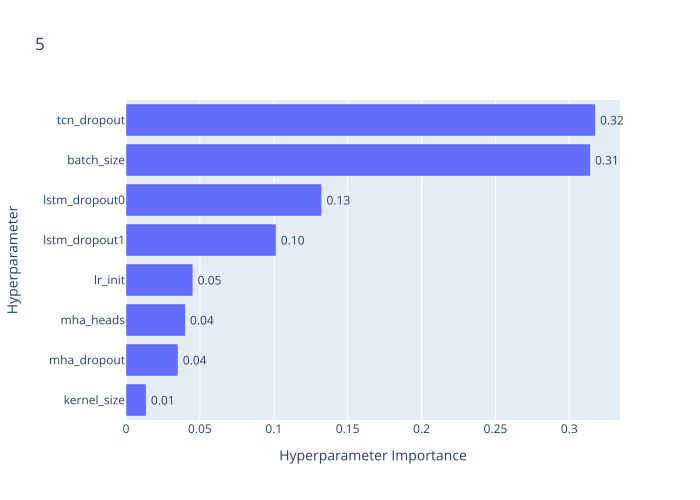

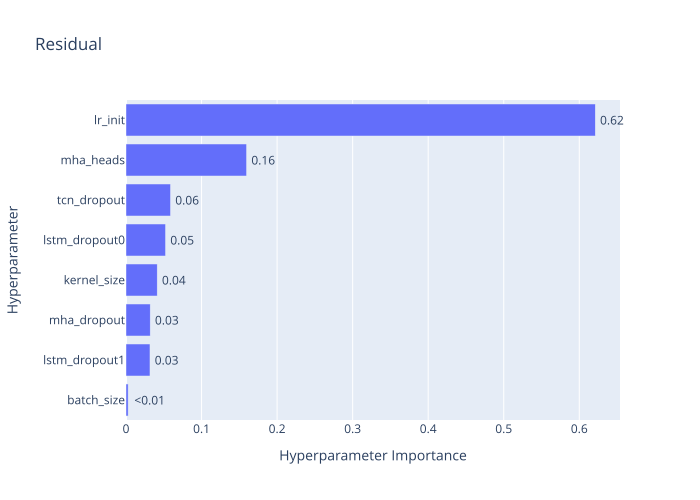

In [7]:
for study, title in zip(studies, titles):
    fig = ov.plot_param_importances(study)
    fig.update_layout(title=title)
    fig.show()